### Especificação do problema 

O objetivo deste trabalho é aplicar a transformada rápida de fourier (do inglês, Fast Fourier Transform - FFT) em imagens digitais, convertendo-as para o domínio da frequência. A filtragem das imagens no domínio de frequência possibilita a alteração de seus valores originais em novas informações, de forma a atenuar ruído das imagens, suavizar os dados, aumentar o contraste, realçar detalhes (bordas) das imagens, entre outras operações.

In [1]:
from cv2 import cv2
from sklearn.cluster import KMeans
import numpy as np
from utils import *

Carregando a imagem...

In [2]:
img = cv2.imread('../../images/bw/baboon.png', cv2.IMREAD_GRAYSCALE)
origin_min = img.min()
origin_max = img.max()

Funções de transformada de fourier e transformada inversa, ambas deslocam o componente de frequência zero, a primeira para o centro, a segunda para o lugar de origem.

In [3]:
def fft_fftshift(img):
    f = np.fft.fft2(img) #transformada de fourier
    fshift = np.fft.fftshift(f)  #Deslocamento do componente de frequência-zero para o centro do espectro
    magnitude_spectrum = 20*np.log(np.abs(fshift)) # calculando o espectro

    return fshift, magnitude_spectrum

def ifft_ifftshift(img):
    f_ishift = np.fft.ifftshift(img) # Retornando a componente de frequência-zero para o lugar original
    img_back = np.fft.ifft2(f_ishift) # transformada inversa de fourier
    img_back = np.abs(img_back) 
    #normalização p/ não estourar memória
    norm_image = cv2.normalize(img_back, None, alpha=origin_min, beta=origin_max, norm_type=cv2.NORM_MINMAX, dtype=cv2.DFT_COMPLEX_OUTPUT).astype(np.uint8)
    
    return norm_image

# Imagem original

Fazemos a transformada de Fourier, verificamos o espectro da imagem e retornamos para a imagem original utilizando a transformada inversa de Fourier.

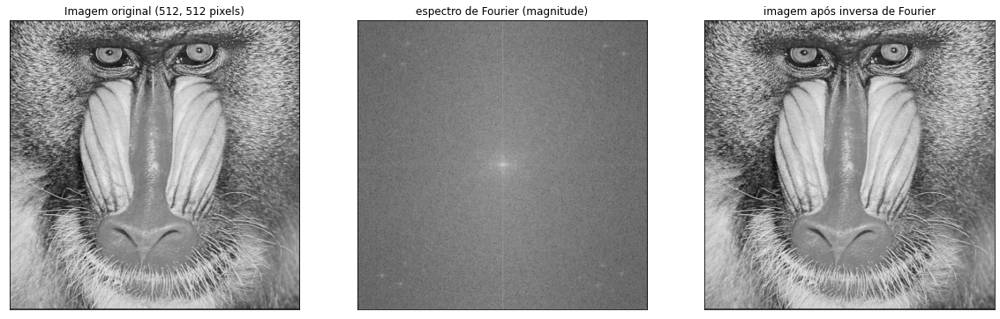

In [4]:
fshift_before, magnitude_spectrum = fft_fftshift(img)
img_ifft = ifft_ifftshift(fshift_before)
plot_(img, magnitude_spectrum, img_ifft, ['Imagem original (512, 512 pixels)', 'espectro de Fourier (magnitude)', 'imagem após inversa de Fourier'])

# Filtros: Passa-baixa, Passa-alta, Passa-faixa

Os nomes dos filtros são bem sugestivos ao que eles fazem na imagem, o filtro passa-baixa deixa na imagem apenas frequências abaixo de uma frequência determinada.

Por outro lado, o filtro passa-alta deixa na imagem apenas as frequências acima de uma frequência determinada.

Por fim, o filtro passa-faixa deixa na imagem apenas as frequências dentro de um intervalo especificado.

## Filtro passa-baixa

A máscara do filtro passa-baixa é feita através da função circle do cv2, que calcula a máscara através da coordenada do centro da imagem e do raio do círculo. A gente também pode adicionar a cor do círculo que nesse caso é branco porque queremos deixar passar as menores frequências que estão no centro do espectro graças ao deslocamento da frequência zero.

Após a geração da máscara multiplicamos pela imagem para gerar nossa imagem filtrada. Explorando um pouco da propriedade da transformada de Fourier, existe uma dualidade tempo x frequência no qual, tudo que é convolução no domínio do tempo, podemos fazer equivalente no domínio da frequência utilizando a multiplicação.

In [5]:
def apply_lowpass(img, radius):
    row, column = img.shape
    central_row, central_col = int(row / 2), int(column / 2)
    mask = np.zeros((row, column), np.uint8)
    img_center = (central_row, central_col)
    mask = cv2.circle(mask, img_center, radius, (1, 1, 1), -1)
    fshift = img * mask
    
    return mask, fshift

## Filtro passa-alta

O filtro passa-alta utiliza a mesma função do cv2 para criação de máscaras em círculo, mas dessa vez com efeito ao contrário, a gente gera uma máscaras de 1's e gera um círculo de 0's, isso faz com que a gente selecione todas as frequências a partir do círculo do centro.

In [6]:
def apply_highpass(img, radius):
    row, column = img.shape
    central_row, central_col = int(row / 2), int(column / 2)
    mask = np.full((row, column), 1, np.uint8) #mascaras de 1
    img_center = (central_row, central_col)
    mask = cv2.circle(mask, img_center, radius, (0, 0, 0), -1) #circulo de 0s na mascara de 1s
    
    fshift = img * mask
    
    return mask, fshift

## Filtro passa-faixa

O filtro passa-faixa nada mais é do que a combinação dos filtros passa-baixa e passa-alta, que combinados formam um círculo com um intervalo e permite que as frequências de uma faixa específica sejam selecionadas.

In [7]:
def apply_bandpass(img, radius_low, radius_high):
    lowpass, _ = apply_lowpass(img, radius_low)
    highpass, _ = apply_highpass(img, radius_high)
    
    mask = lowpass + highpass
    mask[mask < 2] = 0 # limpando o excesso dos outros filtros
    
    fshift = img * mask
    
    return mask, fshift

Para verificarmos melhor o efeito dos filtros, vamos observar uma faixa entre 10 e 120, de todos os filtros. Obs: O passa-faixa sempre vai de (120, 10) até (120, 120).

núcleo dos filtros - raio 10


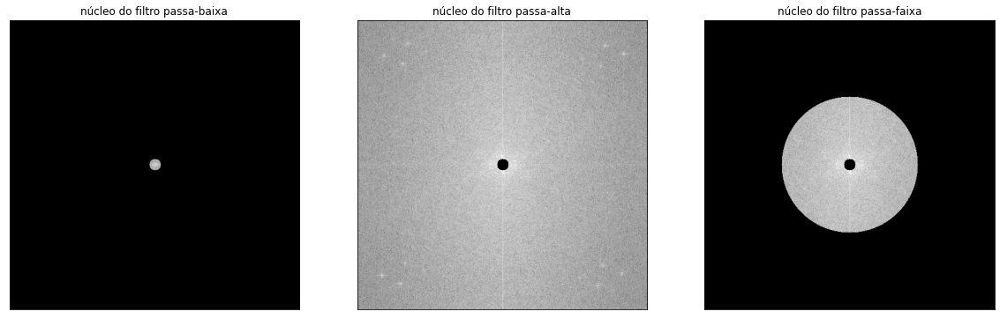

resultados dos filtros aplicados - raio 10


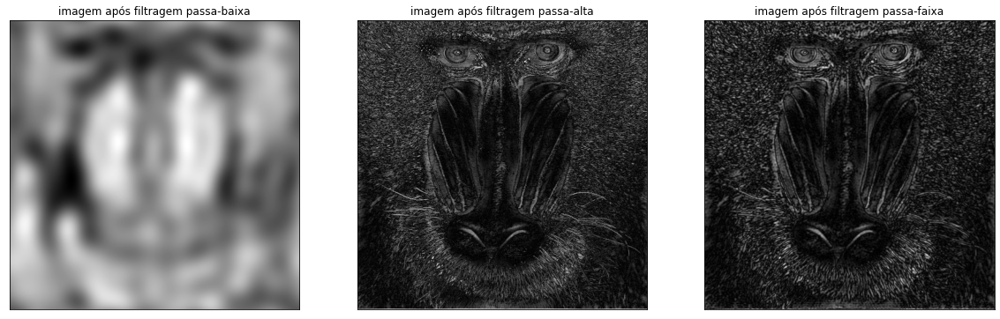

núcleo dos filtros - raio 20


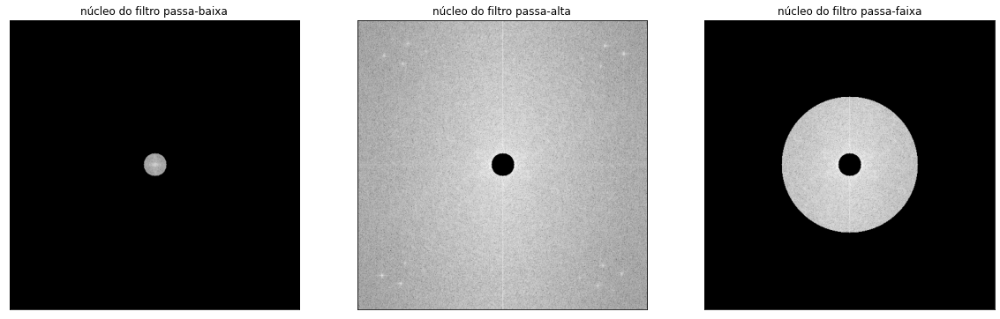

resultados dos filtros aplicados - raio 20


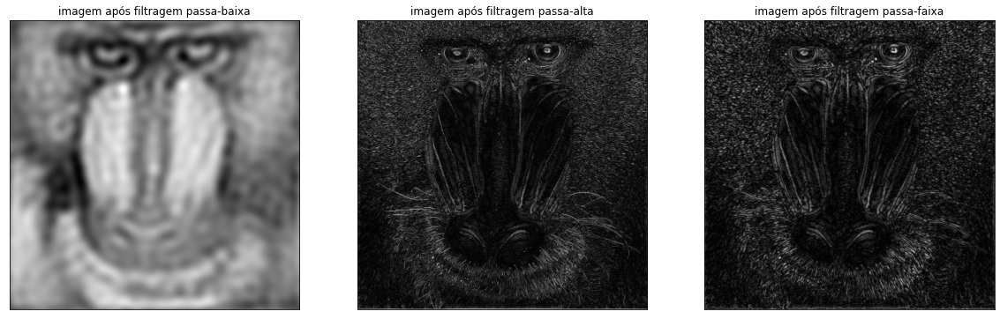

núcleo dos filtros - raio 30


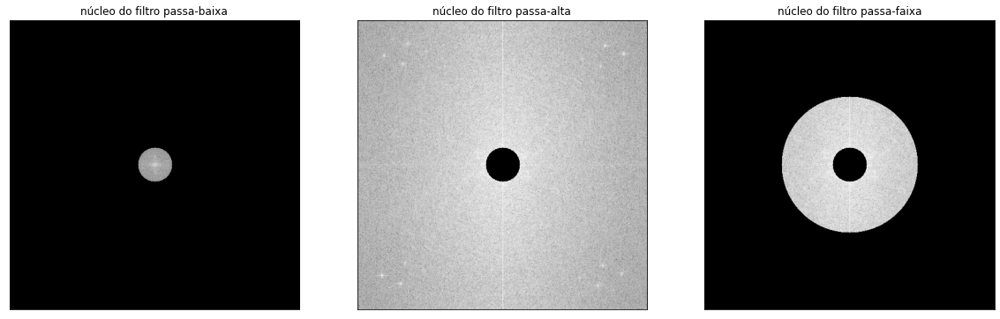

resultados dos filtros aplicados - raio 30


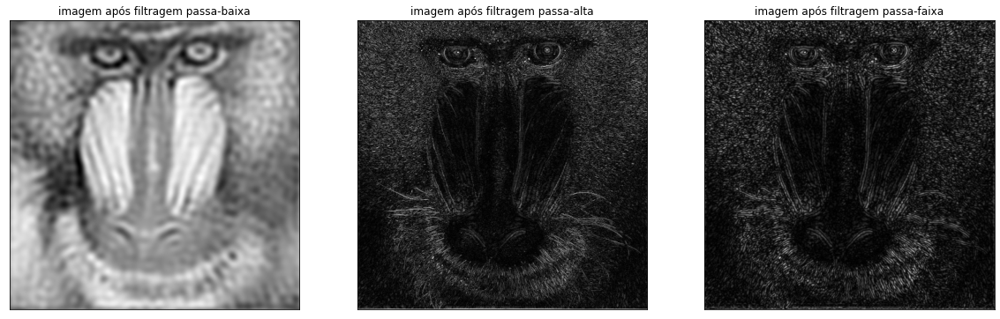

núcleo dos filtros - raio 40


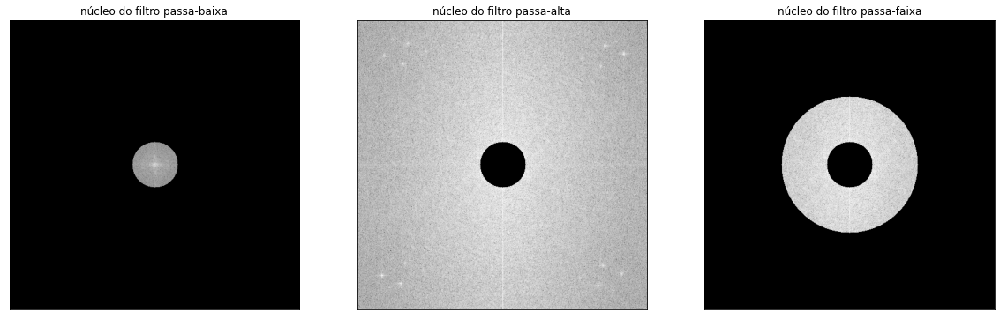

resultados dos filtros aplicados - raio 40


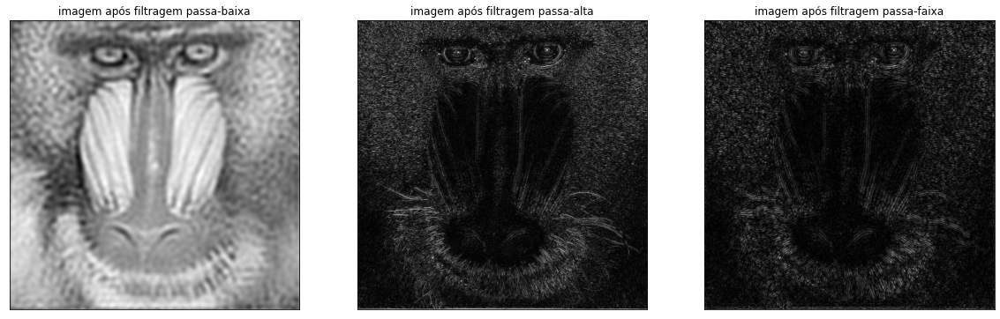

núcleo dos filtros - raio 50


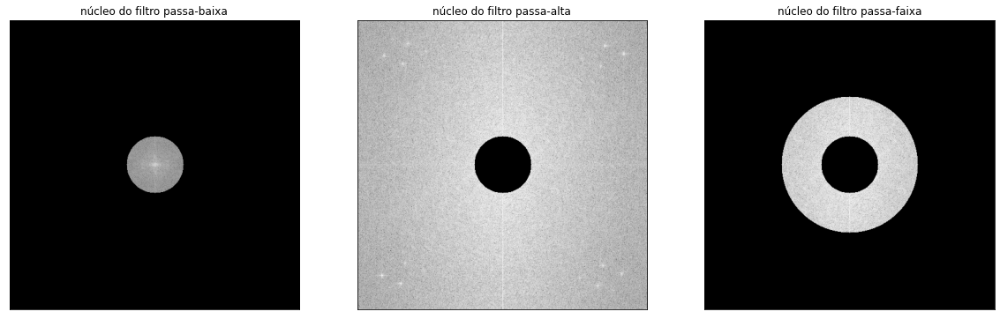

resultados dos filtros aplicados - raio 50


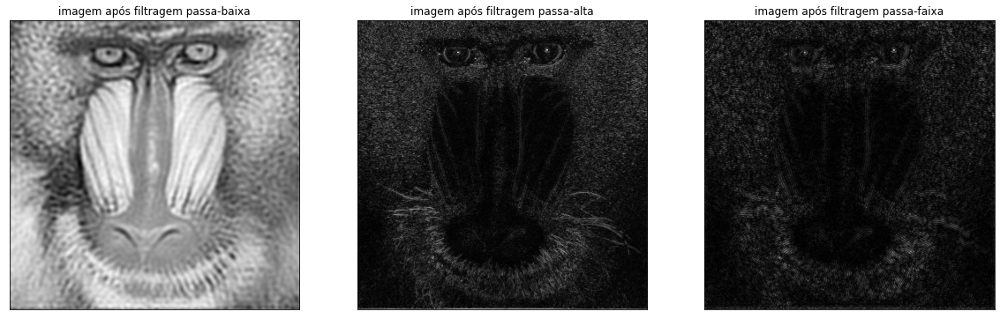

núcleo dos filtros - raio 60


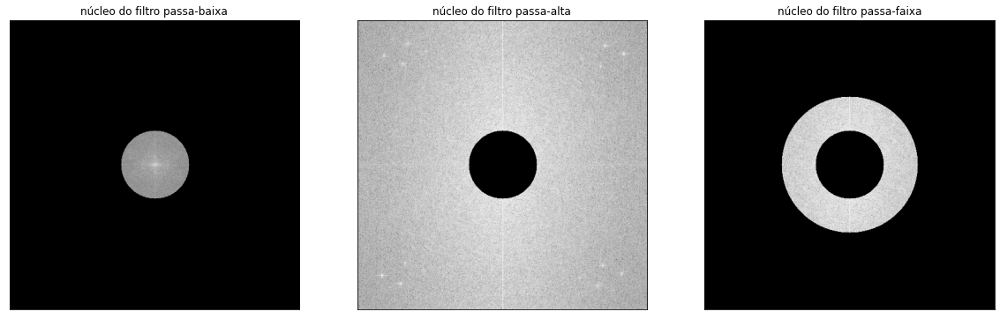

resultados dos filtros aplicados - raio 60


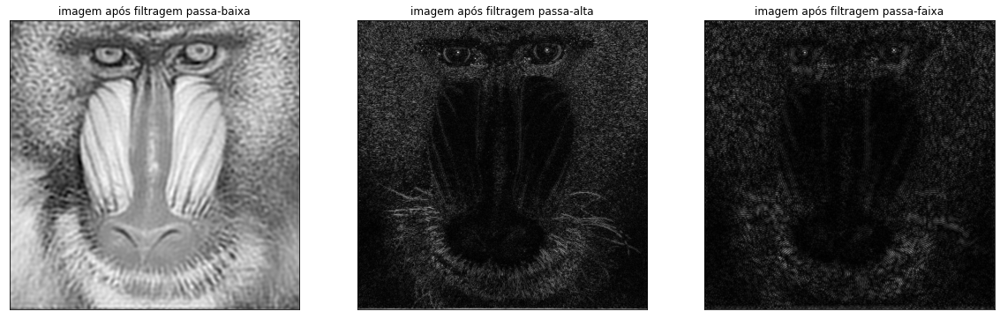

núcleo dos filtros - raio 70


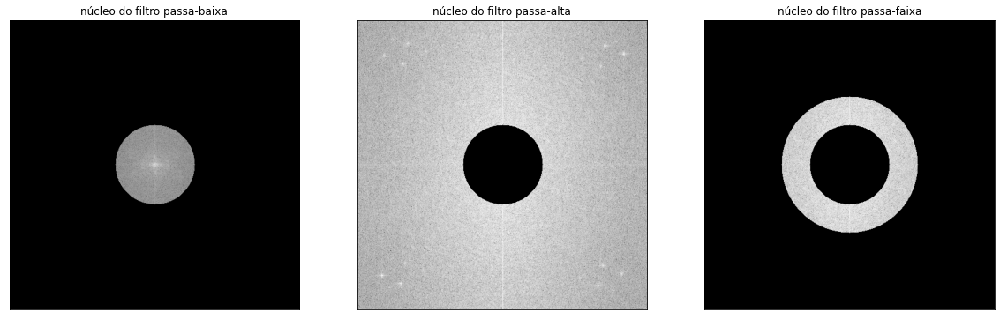

resultados dos filtros aplicados - raio 70


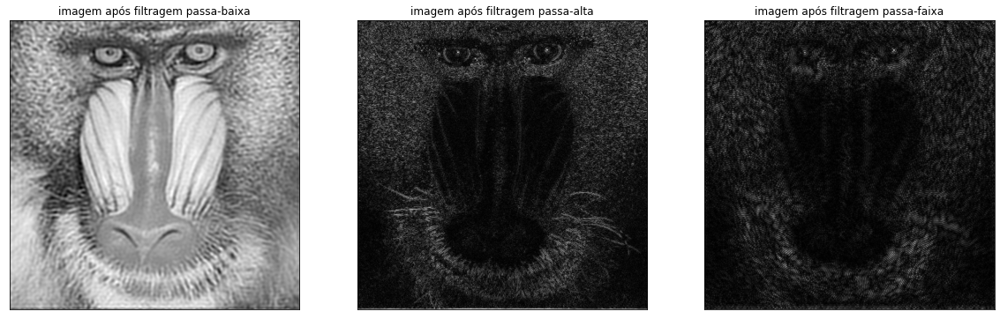

núcleo dos filtros - raio 80


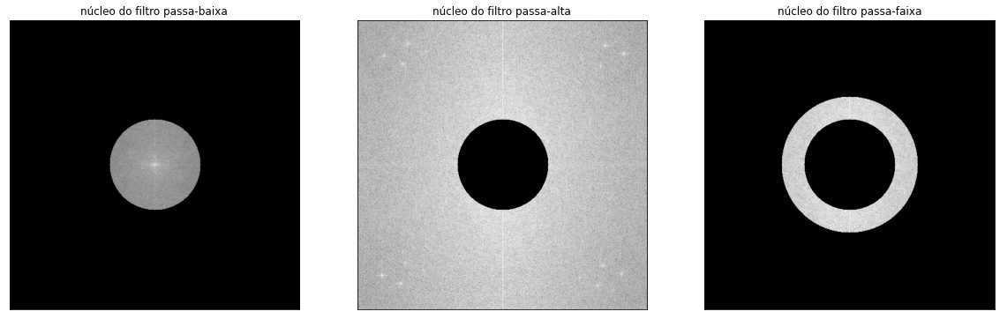

resultados dos filtros aplicados - raio 80


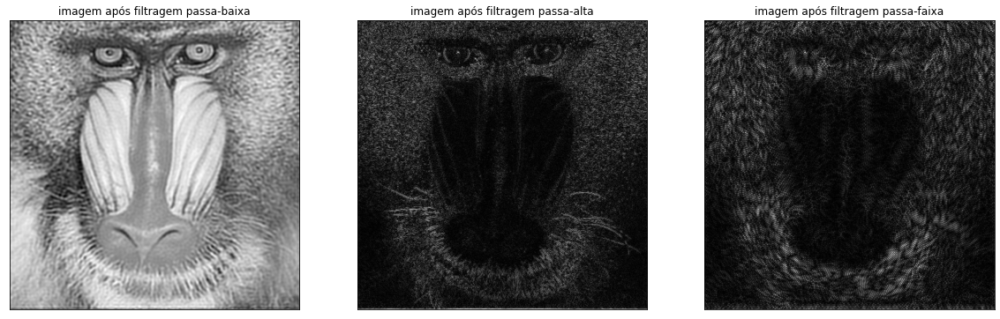

núcleo dos filtros - raio 90


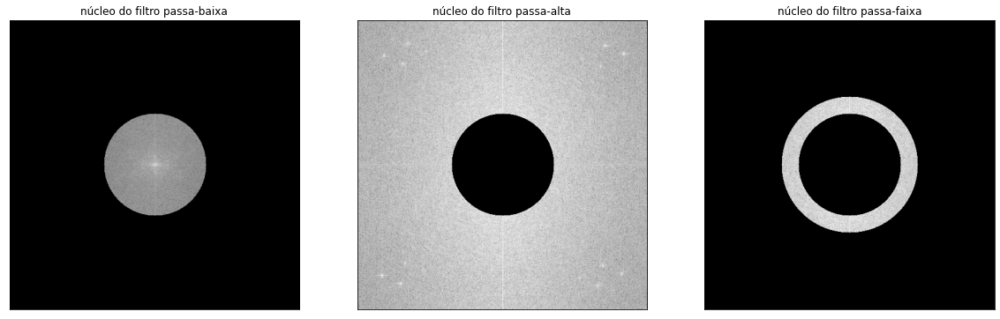

resultados dos filtros aplicados - raio 90


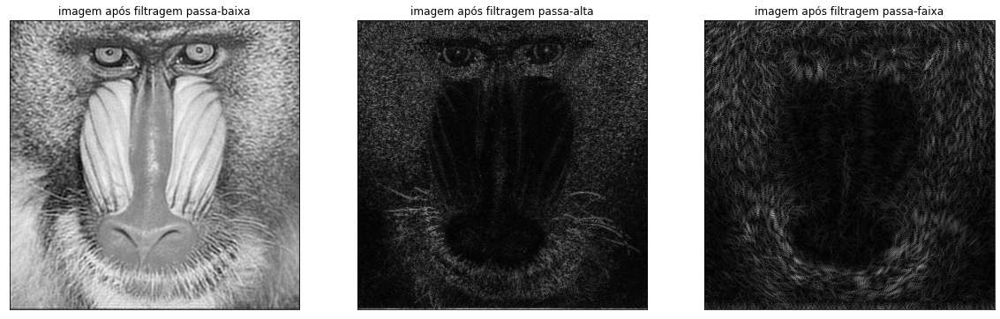

núcleo dos filtros - raio 100


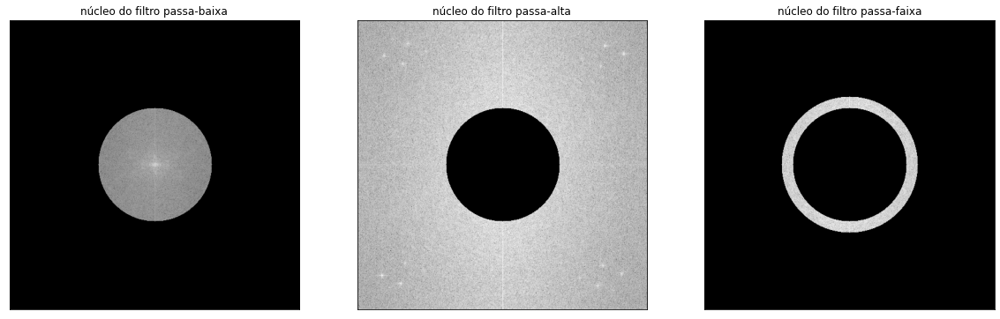

resultados dos filtros aplicados - raio 100


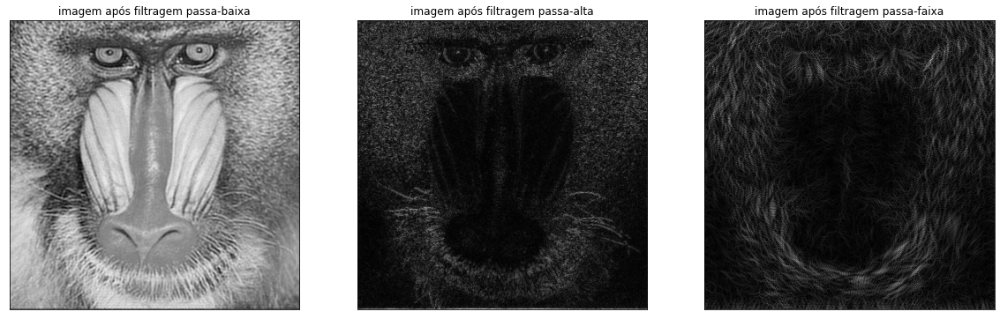

núcleo dos filtros - raio 110


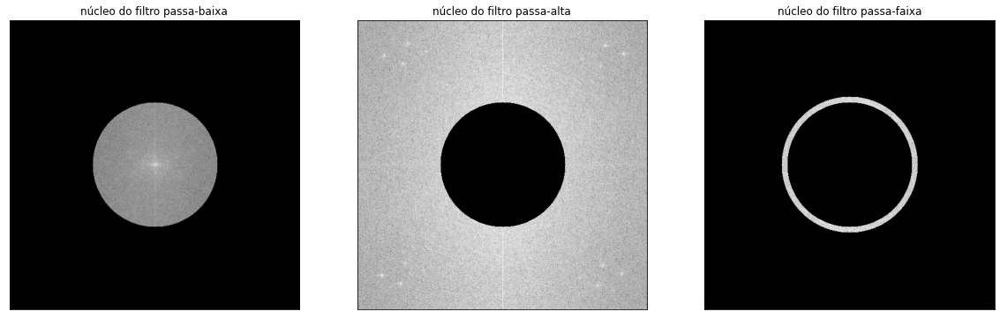

resultados dos filtros aplicados - raio 110


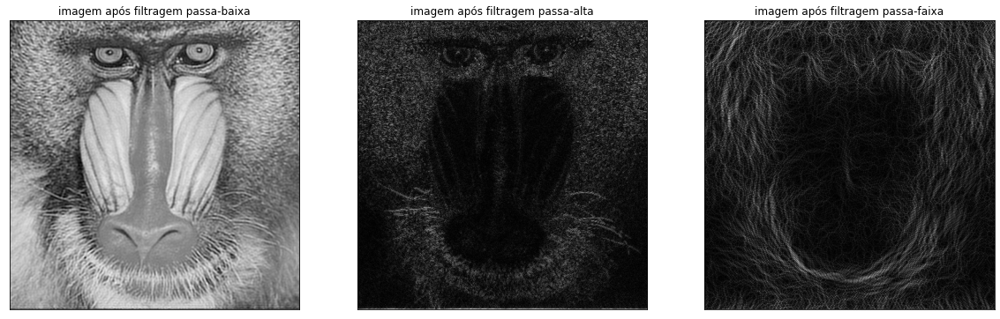

núcleo dos filtros - raio 120


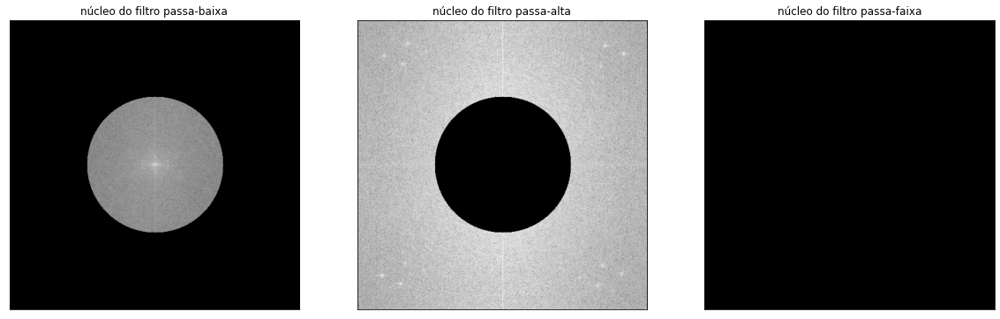

resultados dos filtros aplicados - raio 120


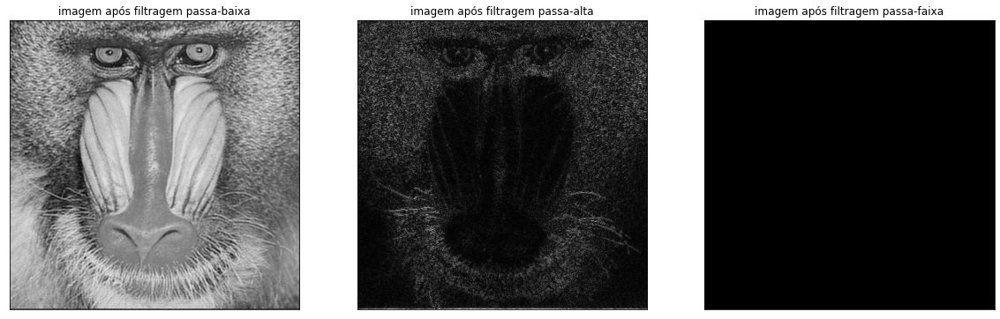

In [8]:
for i in range(10, 130, 10):
        mask, low_core = apply_lowpass(magnitude_spectrum, i)
        mask, high_core = apply_highpass(magnitude_spectrum, i)
        mask, pass_core = apply_bandpass(magnitude_spectrum, 120, i)
        
        print('núcleo dos filtros - raio {}'.format(i))
        plot_(low_core, high_core, pass_core, ['núcleo do filtro passa-baixa', 'núcleo do filtro passa-alta', 'núcleo do filtro passa-faixa'])

        mask, low_core = apply_lowpass(fshift_before, i)
        mask, high_core = apply_highpass(fshift_before, i)
        mask, pass_core = apply_bandpass(fshift_before, 120, i)

        low_ifft = ifft_ifftshift(low_core)
        high_ifft = ifft_ifftshift(high_core)
        pass_ifft = ifft_ifftshift(pass_core)
        
        print('resultados dos filtros aplicados - raio {}'.format(i))
        plot_(low_ifft, high_ifft, pass_ifft, ['imagem após filtragem passa-baixa', 'imagem após filtragem passa-alta', 'imagem após filtragem passa-faixa'])

Podemos verificar nesses experimentos que:
    
    - O filtro passa-baixa causa um blur na imagem, e no caso dessa imagem passa a se tornar nítida a partir do raio 60.
    - O filtro passa-alta causa um efeito de realce de bordas, linhas curvas ou manchas e passa a ficar menos nítido conforme aumentamos o raio. 
    - O filtro passa-faixa é usado para processamentos específicos, principalmente para remover ruídos periódicos, ele tendeu a aumentar o realce de bordas, mas conforme aumentamos o raio a imagem foi ficando extremamente desleal a imagem original. 

# Compressão

Existe uma forma muito interessante de aplicar compressão utilizando K-means, um método de aprendizado não supervisionado. Além disso, também utilizei um outro método de compressão que mantem apenas uma porcentagem dos maiores coeficientes para comparação.

##  Kmeans

A compressão de imagem utilizando Kmeans Clustering é um tipo de método de compressão com perdas. O algoritmo oferece cores de aparência semelhante (que estão juntas em um cluster).

In [9]:
def compression_kmeans(img, k):
    
    kmeans = KMeans(n_clusters=k) 
    kmeans.fit(img) # calculando os clusters

    img = kmeans.cluster_centers_[kmeans.labels_] #salvando os centroids
    img = np.clip(img.astype('uint8'), 0, 255) #restringindo os pixels entre 0 e 255

    return img

Aplicando a compressão do tipo Kmeans podemos notar que a compressão passa a ter menos perdas a partir de 64 clusters, menos que isso é possível verificar a distorção na imagem.

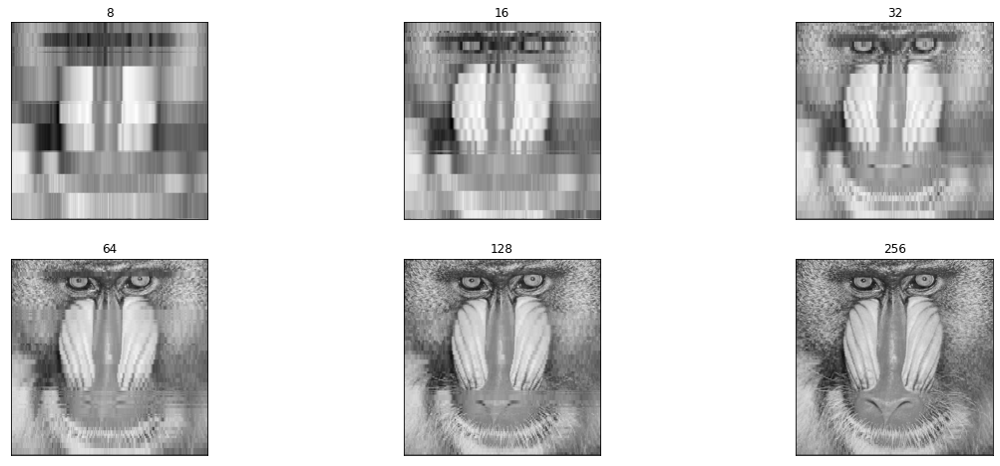

In [10]:
kmeans = []
k = [8, 16, 32, 64, 128, 256] # Quantidade de clusters
for comp in k:
    comp_img = compression_kmeans(img, comp) #função de compressão com kmeans
    kmeans.append(comp_img) #armazenando todos os resultados
    
plot_6(kmeans, k, 'kmeans compression')

## Remoção de coeficientes menores que um limiar

Nesse tipo de compressão selecionamos a porcentagem (threshold) que gostariamos de manter, e adicionamos 0 ao restante. Portanto, comprimimos a imagem com a menor perca possível.



In [11]:
def compression_freq(img):
    img_comp, title = [], []
    fshift, _ = fft_fftshift(img) #passando p/ domínio da frequência
    
    fft_sorted = np.sort(np.abs(fshift.reshape(-1))) #vetor com todos os valores

    for radius in (0.25, 0.1, 0.05, 0.01, 0.002, 0.0002):
        thresh = fft_sorted[int(np.floor((1 - radius) * len(fft_sorted)))] #escolhendo o threshold
        ind = np.abs(fshift) > thresh #adicionando True(1) or False(0) à máscara
        mask = fshift * ind #mantendo apenas os valores acima do threshold
    
        img_ifft = ifft_ifftshift(mask) #retornando p/ domínio do tempo
        img_comp.append(img_ifft) #armazenando todas os resultados 
        title.append(radius)
        
    return img_comp, title

Por outro lado, no caso da compressão na frequência podemos manter até 0.05% dos maiores valores, porcentagens menores do que essa começam a possuir perdas. 

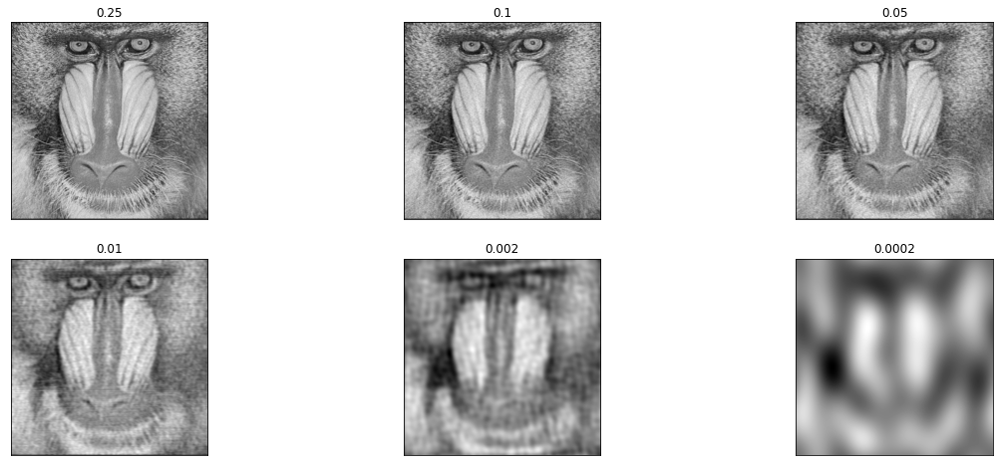

In [12]:
img_comp, title = compression_freq(img)
plot_6(img_comp, title, 'frequency compression')

# Rotação

A rotação da imagem pode ser feita através da matriz na forma:

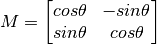

Portanto, gerando-se a matriz podemos aplicar a transformação na imagem original. O OpenCV permite além disso que a imagem tenha qualquer centro de rotação, portanto, sua equação é ligeiramente diferente:

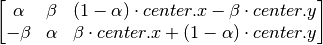



In [13]:
def rotation_45(img, angle=45):
    rows,cols = img.shape

    M = cv2.getRotationMatrix2D((cols/2,rows/2),angle,0.7) #matriz de rotação com angulo 45º
    dst = cv2.warpAffine(np.float32(img),M,(cols,rows)) #aplicando a transformação

    return dst

Nota-se que girando-se a imagem o seu espectro de magnitudes não muda, apenas é rotacionado na mesma direção da imagem.

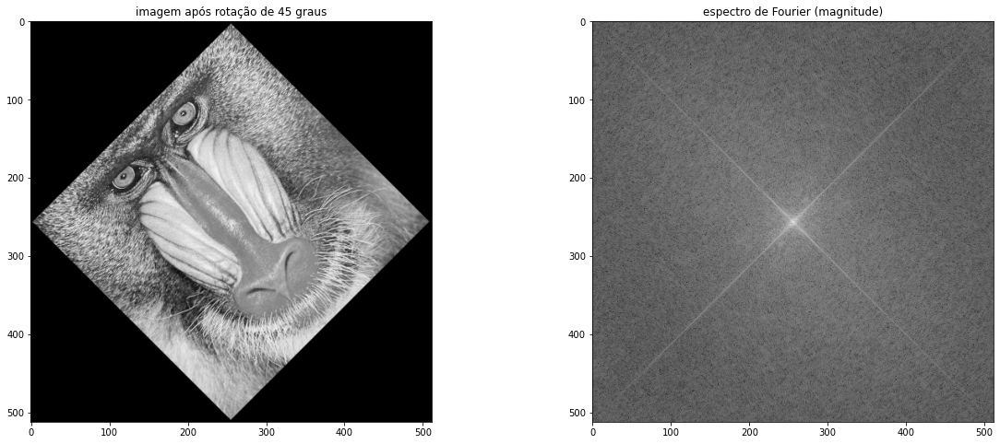

In [14]:
dst = rotation_45(img) #aplicando a rotação
fshift_dst, magnitude_dst = fft_fftshift(dst) #gerando a magnitude do sinal

plt.figure(figsize=(20,8))
plt.subplot(121),plt.imshow(dst, cmap = 'gray'),plt.title('imagem após rotação de 45 graus')
plt.subplot(122),plt.imshow(magnitude_dst, cmap = 'gray'),plt.title('espectro de Fourier (magnitude)')
plt.show()

# Testes realizados

- Todos os testes realizados as imagens utilizadas foram monocromáticas;
- Variou-se os raios dos filtros para verificar diferenças;
- Foi testado dois tipos de compressão a fim de comparação: Kmeans e método de remoção de coeficientes menores que um limiar;
- Variação dos parâmetros da compressão;
- Verificação do espectro da imagem após rotação, após aplicação dos filtros.


# Limitações

- Não funciona com imagens coloridas (rgb).
- É necessário ajustar a porcentagem de ajuste da geração da matriz de rotação, pode cortar alguns pedaços das bordas dependendo da imagem.
- Dependendo do tamanho da imagem, a compressão usando kmeans pode ter alguns problemas se a quantidade de colunas for menor do que o k que está sendo utilizado pelo modelo. Imagens como o coins, devem ser ajustadas para não ter o k=256.
